In [1]:
# once i have wholegenome_offset.trees
import pandas as pd
import tskit
import allel
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tsinfer
import pyslim
import os
from collections import defaultdict

In [2]:
import glob

path2 = '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/'


# Use the glob module to search for files in subfolders
pattern = os.path.join(path2, '**', '*_pop_size.txt')
pop_size_files = glob.glob(pattern, recursive=True)

In [33]:
def arrange_dataset(files):
    joint = pd.DataFrame()
    for i in files:
        one_file = pd.read_csv(i,header=None)
        one_file.columns = [i]
        joint = pd.concat([joint, one_file],axis=1)
    joint = joint.T
    joint.index = joint.index.str.split('/subp').str[0]
    #joint_meansubp = joint.reset_index().groupby('index')[joint.columns].mean()
    return joint

In [4]:
# Use the glob module to search for files in subfolders
pattern = os.path.join(path2, '**', '*_va.txt')
va_files = glob.glob(pattern, recursive=True)

In [34]:
va = arrange_dataset(va_files)

In [5]:
# Use the glob module to search for files in subfolders
pattern = os.path.join(path2, '**', '*_vpheno.txt')
vpheno_files = glob.glob(pattern, recursive=True)

In [39]:
vpheno = arrange_dataset(vpheno_files)

In [6]:
# Use the glob module to search for files in subfolders
pattern = os.path.join(path2, '**', '*_mfitness.txt')
mfitness_files = glob.glob(pattern, recursive=True)

In [85]:
mfitness = arrange_dataset(mfitness_files)

In [7]:
# Use the glob module to search for files in subfolders
pattern = os.path.join(path2, '**', '*_vfitness.txt')
vfitness_files = glob.glob(pattern, recursive=True)

In [ ]:
vfitness = arrange_dataset(vfitness_files)

In [41]:
vpheno

,0,1,2,3,4,5,6,7,8
index,,,,,,,,,
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima0,12.36090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima1,12.08816,7.194230,5.464600,5.333525,5.616560,5.660435,5.796060,5.872410,5.930500
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima2,12.05448,8.118724,4.123906,2.172384,1.427492,1.126455,0.984168,0.922789,0.928013
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima3,12.07114,9.254828,8.313828,7.455116,6.878940,6.449074,6.239084,6.013678,5.863226
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima4,11.91488,10.302722,8.050446,4.770398,2.408898,1.177187,0.780805,0.638391,0.461311
...,...,...,...,...,...,...,...,...,...
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima0,19.02884,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima1,18.50320,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima2,18.94798,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
va

,0,1,2,3,4,5,6,7,8
index,,,,,,,,,
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima0,4.85184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima1,4.85184,2.892745,2.196265,2.137795,2.240890,2.264990,2.330175,2.361935,2.361640
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima2,4.85184,3.261522,1.649270,0.867103,0.570352,0.450148,0.394103,0.369604,0.371856
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima3,4.85184,3.704850,3.320080,2.982074,2.757256,2.582734,2.501616,2.409332,2.352880
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima4,4.85184,4.102362,3.206702,1.902618,0.965186,0.471476,0.312985,0.255237,0.184178
...,...,...,...,...,...,...,...,...,...
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima0,7.45592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima1,7.45592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima2,7.45592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: ylabel='index'>

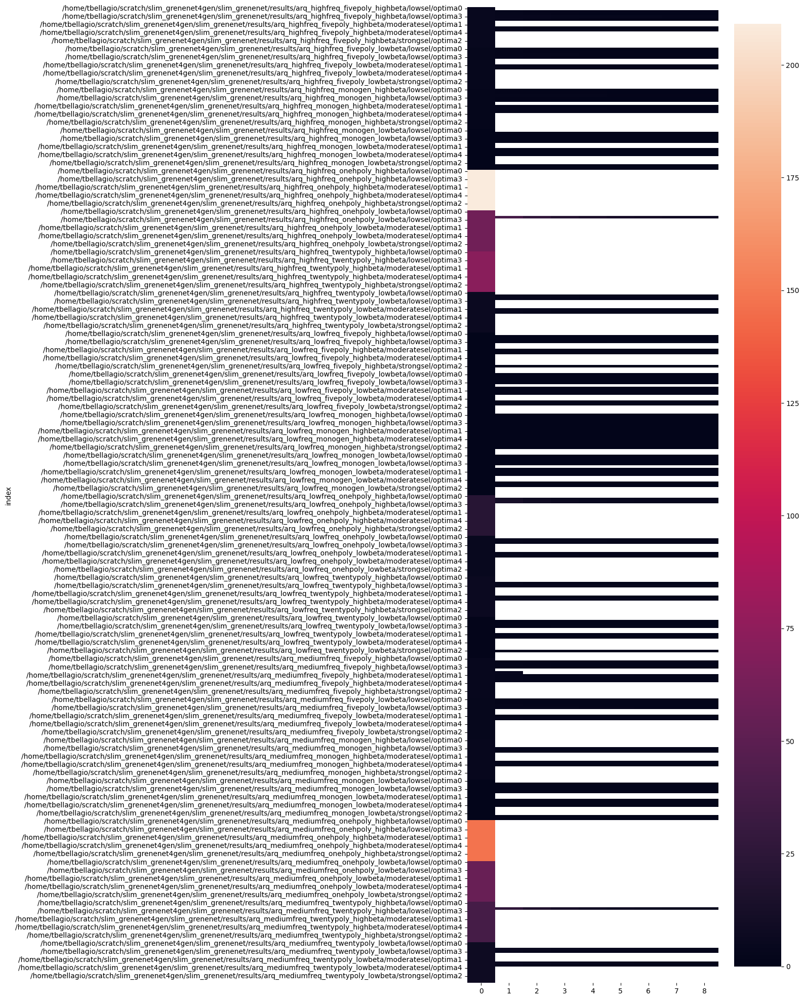

In [37]:
plt.figure(figsize=(8, 25)) 
sns.heatmap(va)

<Axes: ylabel='index'>

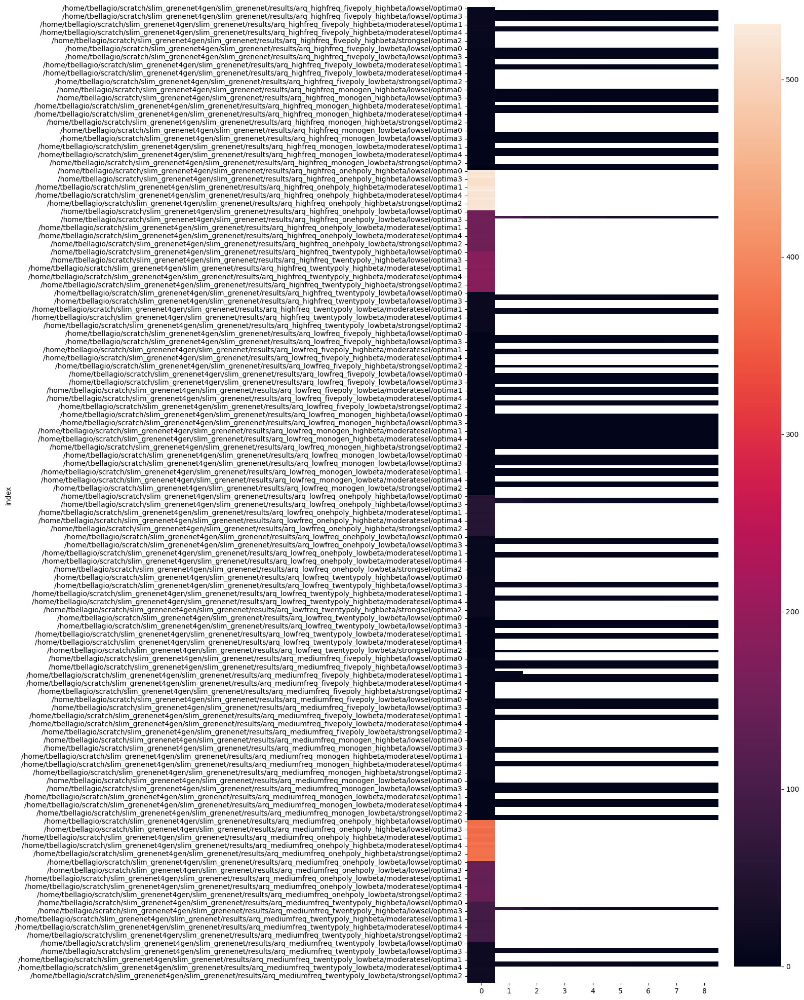

In [40]:
plt.figure(figsize=(8, 25)) 
sns.heatmap(vpheno)

In [45]:
mfitness

,0,1,2,3,4,5,6,7,8
index,,,,,,,,,
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima0,0.169039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima1,0.352795,0.449871,0.506349,0.541538,0.571246,0.588661,0.602585,0.619974,0.627023
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima2,0.517744,0.615151,0.745548,0.834119,0.875659,0.894756,0.903923,0.908422,0.908756
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima3,0.532102,0.578985,0.599365,0.617703,0.630530,0.642040,0.650717,0.656932,0.662525
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima4,0.390618,0.486118,0.583975,0.709816,0.824276,0.896826,0.925836,0.938342,0.953402
...,...,...,...,...,...,...,...,...,...
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima0,0.028845,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima1,0.089379,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_mediumfreq_twentypoly_lowbeta/strongsel/optima2,0.185396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: ylabel='index'>

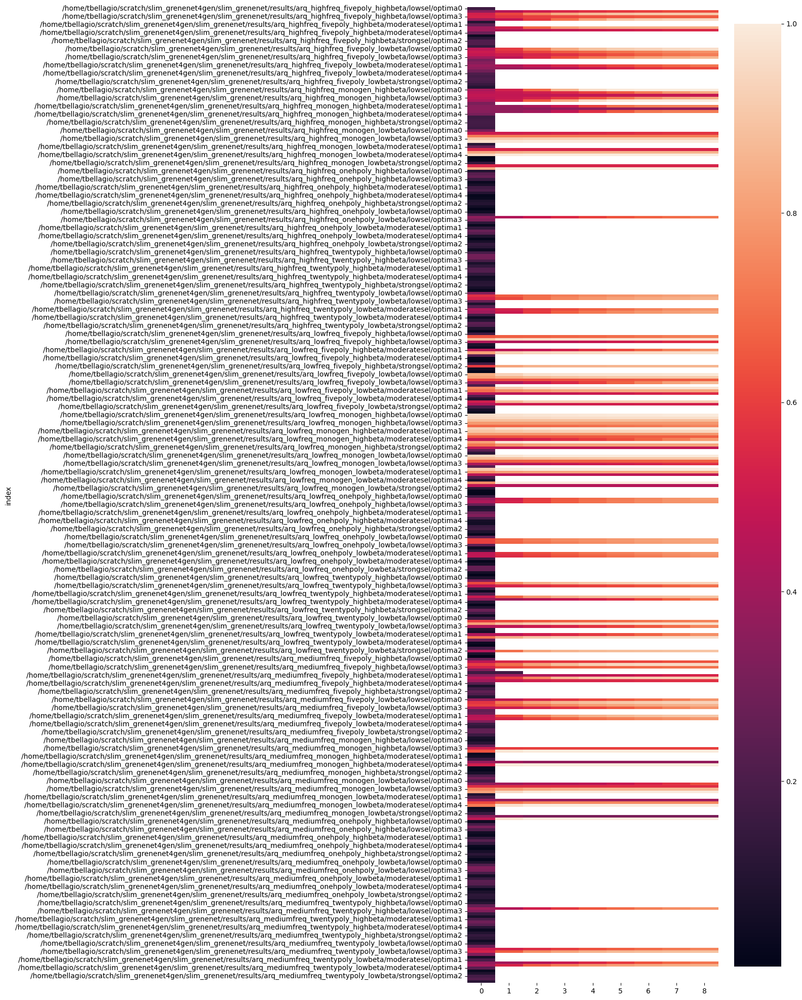

In [43]:
plt.figure(figsize=(8, 25)) 
sns.heatmap(mfitness)

<Axes: ylabel='index'>

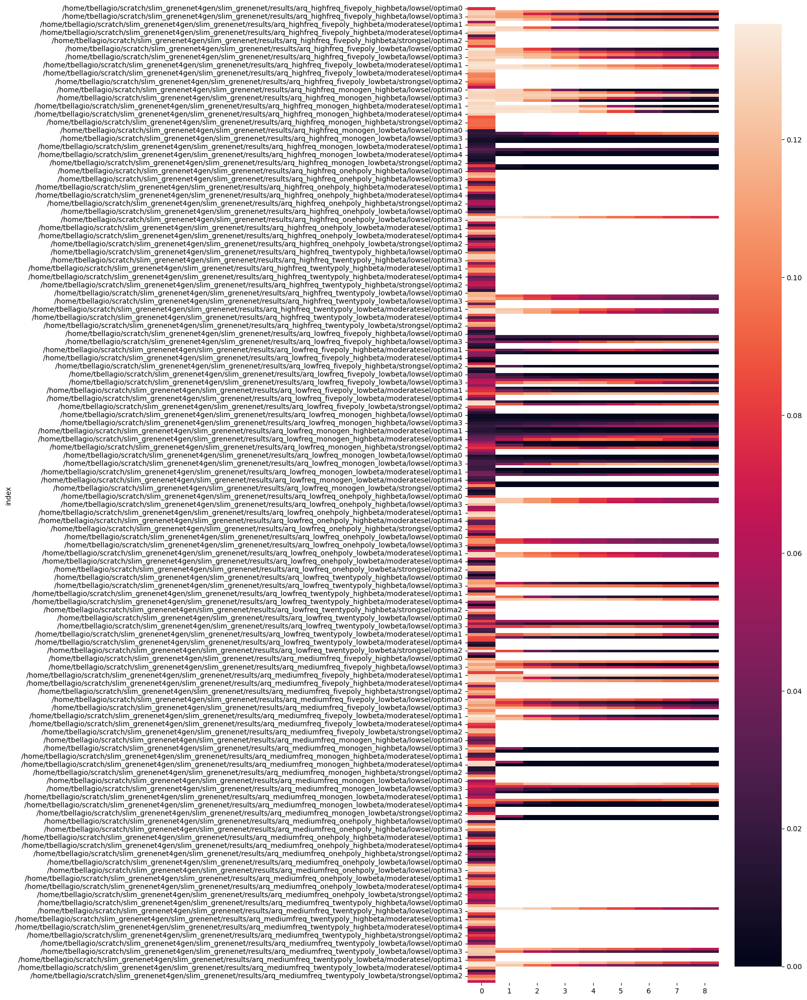

In [44]:
vfitness
plt.figure(figsize=(8, 25)) 
sns.heatmap(vfitness)

In [ ]:
#if i want to compare low and high beta 

In [89]:
mfitness_beta = mfitness.copy()
mfitness_beta['beta'] = mfitness_beta.index.str.split('poly_').str[1].str.split('/').str[0]

mfitness_beta.index = mfitness_beta.index.str.replace('_lowbeta', '').str.replace('_highbeta', '')

mfitness_highbeta = mfitness_beta[mfitness_beta['beta'] == 'highbeta'].drop(['beta'],axis=1)

mfitness_lowbeta = mfitness_beta[mfitness_beta['beta'] == 'lowbeta'].drop(['beta'],axis=1)

mfitness_highbeta.columns = ['hb0', 'hb1', 'hb2', 'hb3', 'hb4', 'hb5', 'hb6', 'hb7', 'hb8']

mfitness_lowbeta.columns = ['lb0', 'lb1', 'lb2', 'lb3', 'lb4', 'lb5', 'lb6', 'lb7', 'lb8']

mfitness_beta = pd.concat([mfitness_highbeta,mfitness_lowbeta ],axis=1)

<Axes: ylabel='index'>

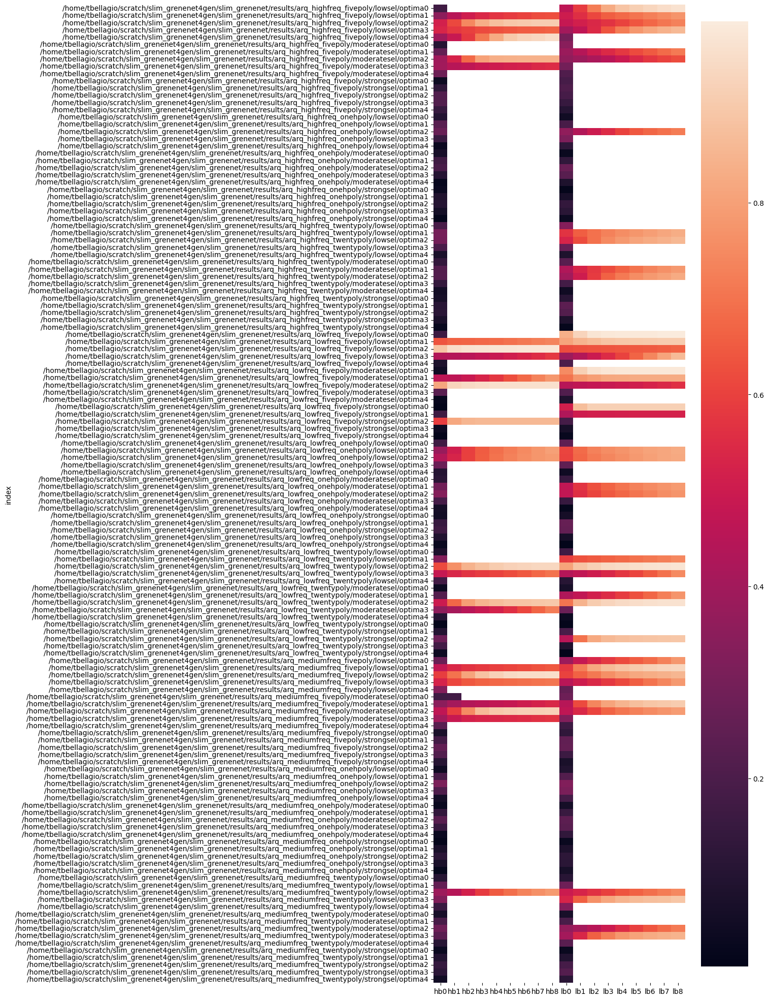

In [90]:
vfitness
plt.figure(figsize=(8, 25)) 
sns.heatmap(mfitness_beta)

In [91]:
mfitness.index

Index(['/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima0',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima1',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima2',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima3',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/lowsel/optima4',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/moderatesel/optima0',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/moderatesel/optima1',
       '/home/tbellagio/scratch/slim_grenenet4gen/slim_grenenet/results/arq_highfreq_fivepoly_highbeta/moderatesel/optima2',
       '/home/tbellagio/s

In [140]:
mfitness_sel= mfitness.copy()
mfitness_sel['sel'] = mfitness_sel.index.str.split('beta/').str[1].str.split('/').str[0]

mfitness_sel.index = mfitness_sel.index.str.replace('lowsel/', '').str.replace('moderatesel/', '').str.replace('strongsel/', '')

mfitness_lsel = mfitness_sel[mfitness_sel['sel'] == 'lowsel'].drop(['sel'],axis=1)

mfitness_msel = mfitness_sel[mfitness_sel['sel'] == 'moderatesel'].drop(['sel'],axis=1)

mfitness_ssel = mfitness_sel[mfitness_sel['sel'] == 'strongsel'].drop(['sel'],axis=1)

mfitness_lsel.columns = [str(i) + 'lsel' for i in mfitness_lsel.columns]

mfitness_msel.columns = [str(i) + 'msel' for i in mfitness_msel.columns]

mfitness_ssel.columns = [str(i) + 'ssel' for i in mfitness_ssel.columns]

mfitness_sel = pd.concat([mfitness_lsel,mfitness_msel, mfitness_ssel ],axis=1)

<Axes: ylabel='index'>

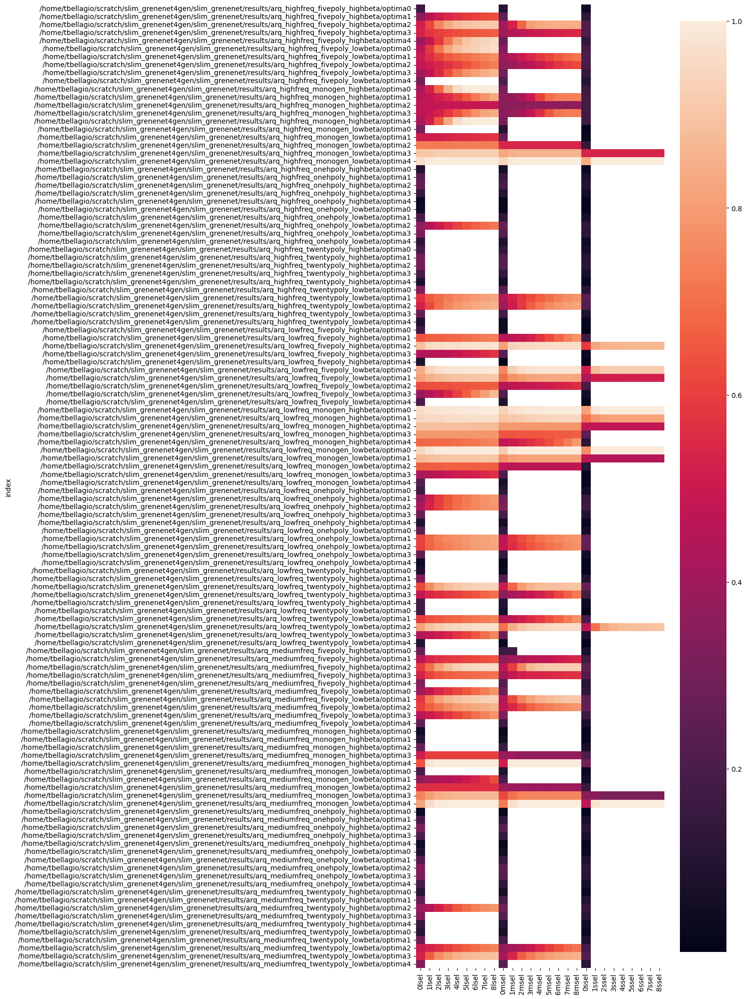

In [141]:

plt.figure(figsize=(8, 25)) 
sns.heatmap(mfitness_sel)

In [150]:
mfitness_sel_poly= mfitness_sel.copy()

In [151]:
mfitness_sel_poly['poly'] = mfitness_sel_poly.index.str.split('freq_').str[1].str.split('_').str[0]


In [152]:
mfitness_sel_poly.index.str.split('_').str[-2].unique()

Index(['fivepoly', 'monogen', 'onehpoly', 'twentypoly'], dtype='object', name='index')

In [153]:
mfitness_sel_poly.index = mfitness_sel_poly.index.str.replace('fivepoly_', '').str.replace('monogen_', '').str.replace('onehpoly_', '').str.replace('twentypoly_', '')


In [154]:

mfitness_sel_5poly = mfitness_sel_poly[mfitness_sel_poly['poly'] == 'fivepoly'].drop(['poly'],axis=1)

mfitness_sel_1poly = mfitness_sel_poly[mfitness_sel_poly['poly'] == 'monogen'].drop(['poly'],axis=1)

mfitness_sel_100poly = mfitness_sel_poly[mfitness_sel_poly['poly'] == 'onehpoly'].drop(['poly'],axis=1)

mfitness_sel_20poly = mfitness_sel_poly[mfitness_sel_poly['poly'] == 'twentypoly'].drop(['poly'],axis=1)

mfitness_sel_1poly.columns = [str(i) + '1p' for i in mfitness_sel_1poly.columns]

mfitness_sel_5poly.columns = [str(i) + '5p' for i in mfitness_sel_5poly.columns]

mfitness_sel_20poly.columns = [str(i) + '20p' for i in mfitness_sel_20poly.columns]

mfitness_sel_100poly.columns = [str(i) + '100p' for i in mfitness_sel_100poly.columns]


mfitness_sel_poly = pd.concat([mfitness_sel_1poly,mfitness_sel_5poly, mfitness_sel_20poly,  mfitness_sel_100poly],axis=1)

In [162]:
mfitness_sel_poly.index = mfitness_sel_poly.index.str.split('results/').str[1]

<Axes: ylabel='index'>

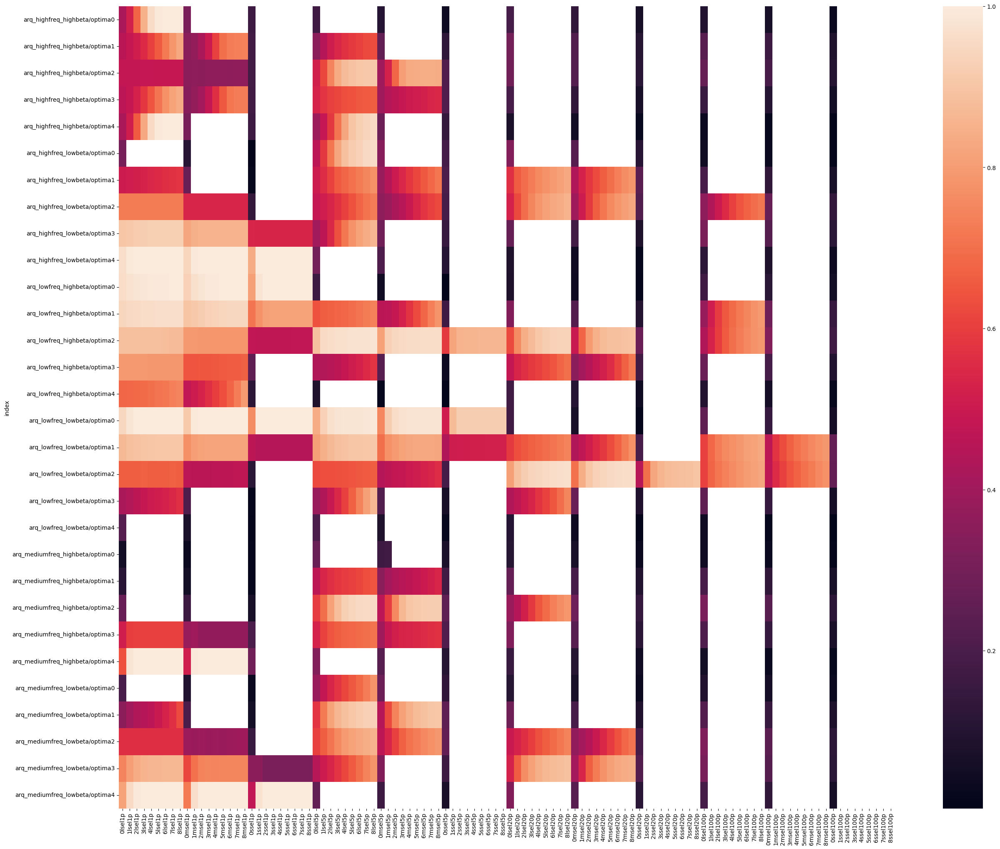

In [163]:
plt.figure(figsize=(30, 25)) 
sns.heatmap(mfitness_sel_poly)

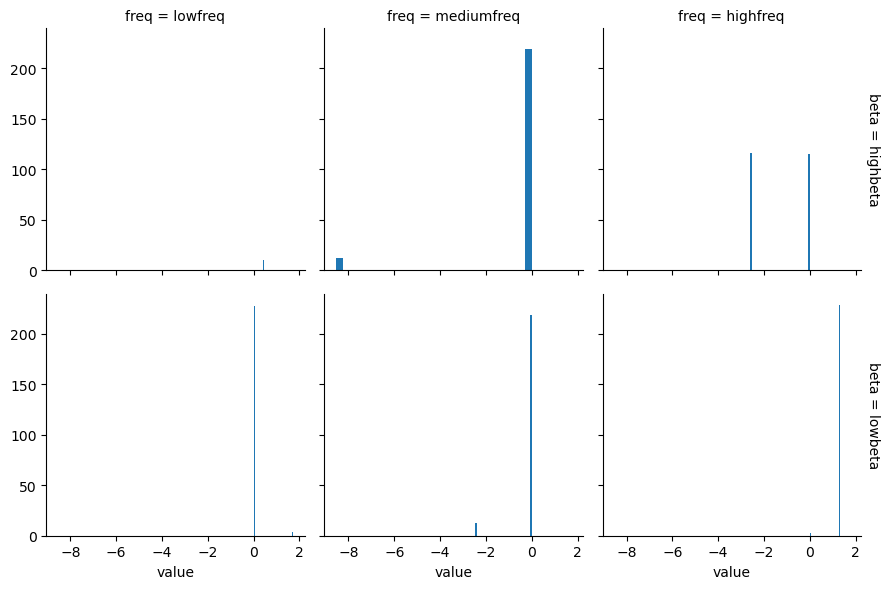

In [279]:
onehpoly = [i for i in os.listdir(path2 + '/results') if 'monogen' in i]

phenotypes_1hp = pd.DataFrame()

for i in onehpoly:
    
    phenotypes = pd.read_csv(path2 + '/results/' + i + '/phenotypes.csv').drop('Unnamed: 0',axis=1)
    phenotypes.columns = [i]
    phenotypes_1hp = pd.concat([phenotypes_1hp, phenotypes],axis=1)

phenotypes_1hp = phenotypes_1hp.T.reset_index()
phenotypes_1hp['freq'] = phenotypes_1hp['index'].str.split('_').str[1]
phenotypes_1hp['beta'] = phenotypes_1hp['index'].str.split('_').str[-1]
phenotypes_1hp = phenotypes_1hp.pivot_table(columns = ['beta','freq'],values=phenotypes_1hp.columns[1:-2])
col_order = ['lowfreq', 'mediumfreq', 'highfreq']
# Create a grid of subplots using seaborn
g = sns.FacetGrid(phenotypes_1hp.melt(), col='freq', row='beta', margin_titles=True, col_order=col_order)
g.map(plt.hist, 'value', bins=30)
# Adjust layout
g.fig.tight_layout()
# Show the plot
plt.show()

In [282]:
for i in phenotypes_1hp.columns:
    print(phenotypes_1hp[i].nunique())

2
2
2
2
2
2


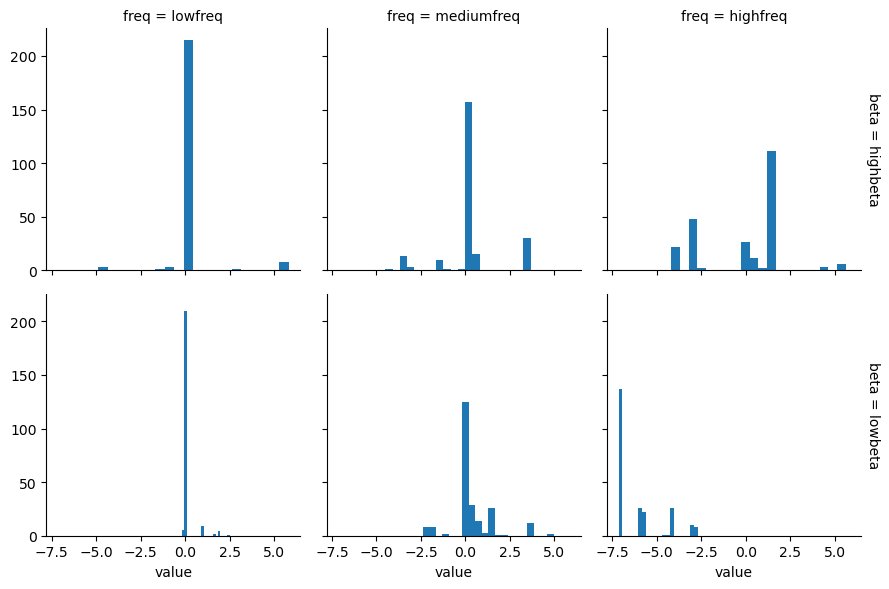

In [287]:
onehpoly = [i for i in os.listdir(path2 + '/results') if 'fivepoly' in i]

phenotypes_1hp = pd.DataFrame()

for i in onehpoly:
    
    phenotypes = pd.read_csv(path2 + '/results/' + i + '/phenotypes.csv').drop('Unnamed: 0',axis=1)
    phenotypes.columns = [i]
    phenotypes_1hp = pd.concat([phenotypes_1hp, phenotypes],axis=1)

phenotypes_1hp = phenotypes_1hp.T.reset_index()
phenotypes_1hp['freq'] = phenotypes_1hp['index'].str.split('_').str[1]
phenotypes_1hp['beta'] = phenotypes_1hp['index'].str.split('_').str[-1]
phenotypes_1hp = phenotypes_1hp.pivot_table(columns = ['beta','freq'],values=phenotypes_1hp.columns[1:-2])
col_order = ['lowfreq', 'mediumfreq', 'highfreq']
# Create a grid of subplots using seaborn
g = sns.FacetGrid(phenotypes_1hp.melt(), col='freq', row='beta', margin_titles=True, col_order=col_order)
g.map(plt.hist, 'value', bins=20)
# Adjust layout
g.fig.tight_layout()
# Show the plot
plt.show()

In [288]:
for i in phenotypes_1hp.columns:
    print(phenotypes_1hp[i].nunique())

25
6
12
16
7
12


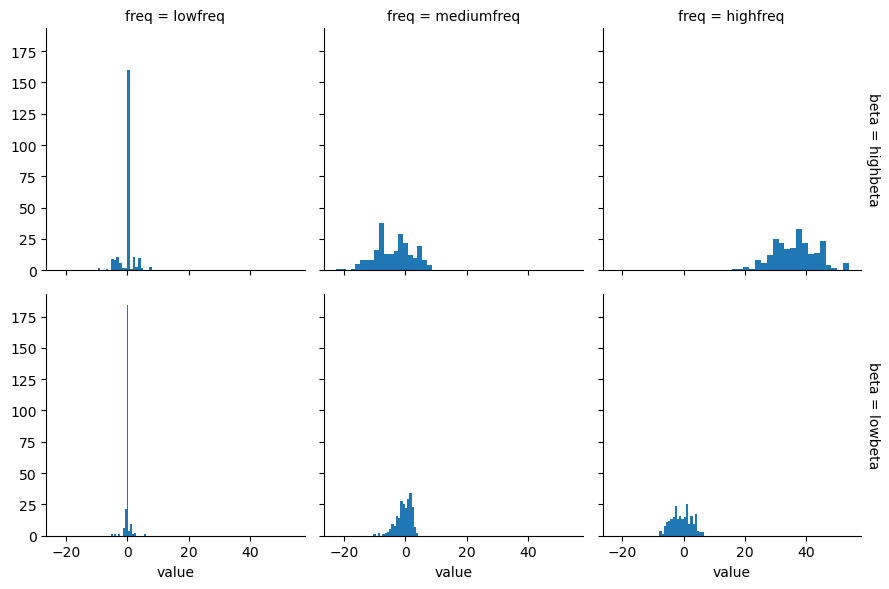

In [289]:
onehpoly = [i for i in os.listdir(path2 + '/results') if 'twentypoly' in i]

phenotypes_1hp = pd.DataFrame()

for i in onehpoly:
    
    phenotypes = pd.read_csv(path2 + '/results/' + i + '/phenotypes.csv').drop('Unnamed: 0',axis=1)
    phenotypes.columns = [i]
    phenotypes_1hp = pd.concat([phenotypes_1hp, phenotypes],axis=1)

phenotypes_1hp = phenotypes_1hp.T.reset_index()
phenotypes_1hp['freq'] = phenotypes_1hp['index'].str.split('_').str[1]
phenotypes_1hp['beta'] = phenotypes_1hp['index'].str.split('_').str[-1]
phenotypes_1hp = phenotypes_1hp.pivot_table(columns = ['beta','freq'],values=phenotypes_1hp.columns[1:-2])
col_order = ['lowfreq', 'mediumfreq', 'highfreq']
# Create a grid of subplots using seaborn
g = sns.FacetGrid(phenotypes_1hp.melt(), col='freq', row='beta', margin_titles=True, col_order=col_order)
g.map(plt.hist, 'value', bins=20)
# Adjust layout
g.fig.tight_layout()
# Show the plot
plt.show()

In [290]:
for i in phenotypes_1hp.columns:
    print(phenotypes_1hp[i].nunique())

214
30
181
211
26
172


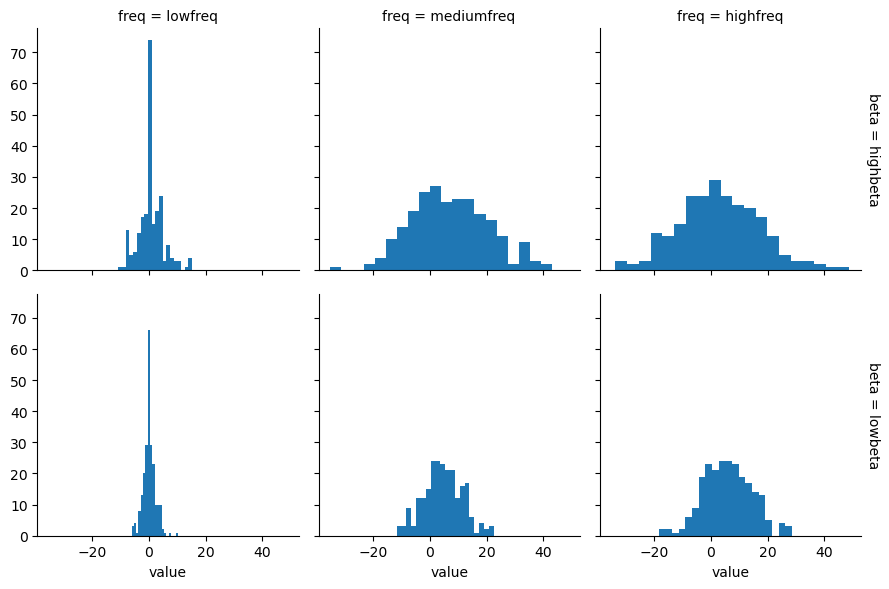

In [291]:
onehpoly = [i for i in os.listdir(path2 + '/results') if 'onehpoly' in i]

phenotypes_1hp = pd.DataFrame()

for i in onehpoly:
    
    phenotypes = pd.read_csv(path2 + '/results/' + i + '/phenotypes.csv').drop('Unnamed: 0',axis=1)
    phenotypes.columns = [i]
    phenotypes_1hp = pd.concat([phenotypes_1hp, phenotypes],axis=1)

phenotypes_1hp = phenotypes_1hp.T.reset_index()
phenotypes_1hp['freq'] = phenotypes_1hp['index'].str.split('_').str[1]
phenotypes_1hp['beta'] = phenotypes_1hp['index'].str.split('_').str[-1]
phenotypes_1hp = phenotypes_1hp.pivot_table(columns = ['beta','freq'],values=phenotypes_1hp.columns[1:-2])
col_order = ['lowfreq', 'mediumfreq', 'highfreq']
# Create a grid of subplots using seaborn
g = sns.FacetGrid(phenotypes_1hp.melt(), col='freq', row='beta', margin_titles=True, col_order=col_order)
g.map(plt.hist, 'value', bins=20)
# Adjust layout
g.fig.tight_layout()
# Show the plot
plt.show()

In [292]:
for i in phenotypes_1hp.columns:
    print(phenotypes_1hp[i].nunique())

231
152
231
231
150
231
